In [1]:
import os, sys

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.signal import find_peaks
import seaborn as sns
import IPython
%matplotlib widget
%matplotlib notebook

In [3]:
data_dir_full_amp = "../../data/2022-11-28/frq_test_batch_1/"
data_dir_half_amp = "../../data/2022-11-28/frq_test_batch_2/"

In [4]:
dirnames = os.listdir(data_dir_full_amp)
dirnames = list(os.path.join(data_dir_full_amp, f) for f in dirnames)

fnames_full_amp = []

for dirname in dirnames:
    if os.path.isdir(dirname):
        files = os.listdir(dirname)
        for file in files:
            if ".dat" in file:
                fnames_full_amp.append(f"{dirname}/{file}")
                
dirnames = os.listdir(data_dir_half_amp)
dirnames = list(os.path.join(data_dir_half_amp, f) for f in dirnames)

fnames_half_amp = []

for dirname in dirnames:
    if os.path.isdir(dirname):
        files = os.listdir(dirname)
        for file in files:
            if ".dat" in file:
                fnames_half_amp.append(f"{dirname}/{file}")


In [5]:
data_half = dict()
data_full = dict()
init_length = 300
def cache_data(fnames):
    data = dict()
    for fname in fnames:
        dat = pd.read_csv(fname)
        dat["t"] = dat["T_(ms)"]/1000 #ms to s
        dat["y"] = (dat["V_dist_(mA)"]*(-100.0/16.0)+125-11.2625) #convert milliamp to millimeters
        dat["strain"] = (init_length-dat["y"])/init_length
        dat["p_c"] = (dat["Comp_P_(mA)"]-4)*0.75
        dat["v"] = dat["Sys_Volts_(V)"]
        dat["l"] = dat["LC_(grams)"]
        dat["p_p"] = (dat["Piezo_P_(mA)"]-4)*0.75
        dat["p_o"] = 6*(dat["Piezo_out_(mV)"]-4000)/16000 #converting milliamp output to expected bar output
        name = fname.split('/')[-1].split('.')[0].split('-')[-1].split('_')[0].replace(',','.')
        data.update({name:dat})
    return data

data_half = cache_data(fnames_half_amp)
data_full = cache_data(fnames_full_amp)

In [76]:
def plot_test(df, name="Experiment"):
    fig, axes = plt.subplots(5,1, sharex=True, figsize=(7.5,5))
    axes[0].plot(df["t"], df["y"],linestyle='None',marker='o',markersize=1)
    axes[0].plot(0, 0,linestyle='None',marker='o',markersize=1, color='r')
    axes[0].grid()
    axes[0].set_ylabel("Distance (mm)")

    axes[1].plot(df["t"], df["l"],linestyle='None',marker='o',markersize=1,color='r')
    axes[1].grid()
    axes[1].set_ylabel("Load (grams)")
    
    axes[2].plot(df["t"], df["p_o"],linestyle='None',marker='o',markersize=1)
    axes[2].grid()
    axes[2].plot(df["t"], df["p_p"],linestyle='None',marker='o',markersize=1)
    axes[2].set_ylabel("Pressure - Actuator \n(Bar)")
    #axes[2].set_ylim([-0.25, 6.25])

    axes[2].legend(["Pressure Out","Pressure Gauge"])

    axes[3].plot(df["t"], df["p_c"],linestyle='None',marker='o',markersize=1)
    axes[3].grid()
    #axes[2].set_ylim([-0.25, 6.25])
    axes[3].set_ylabel("Pressure - Comp. \n(Bar)")

    axes[4].plot(df["t"], df["v"],linestyle='None',marker='o',markersize=1)
    axes[4].grid()
    axes[4].set_ylabel("System (V)")
    plt.suptitle(name, fontsize=24)
    plt.show()

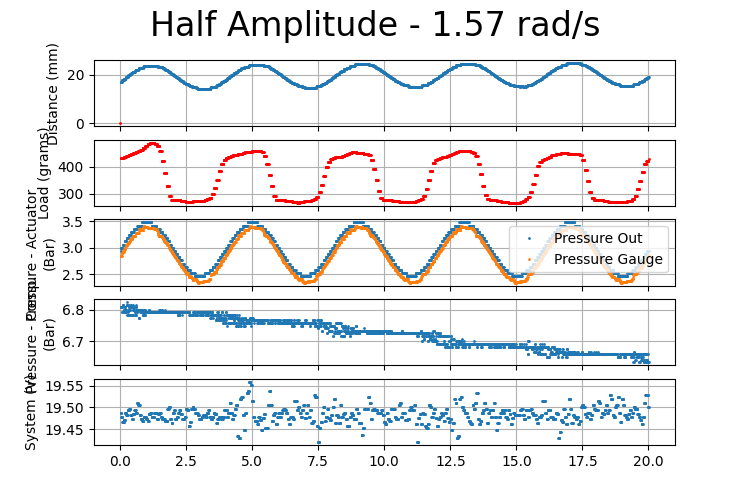

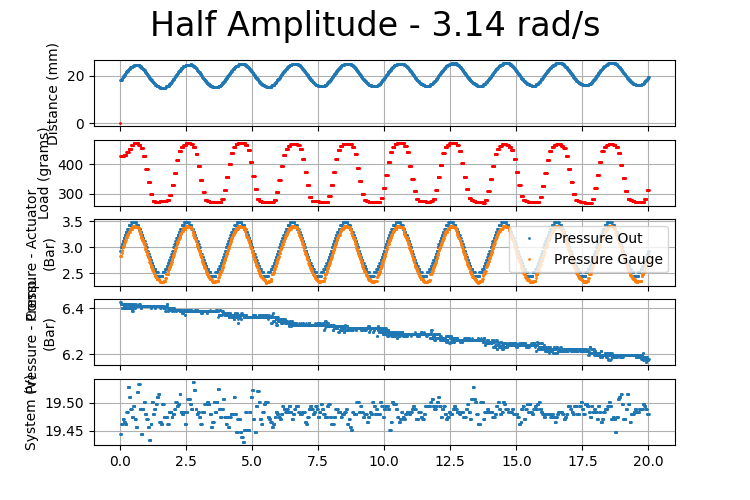

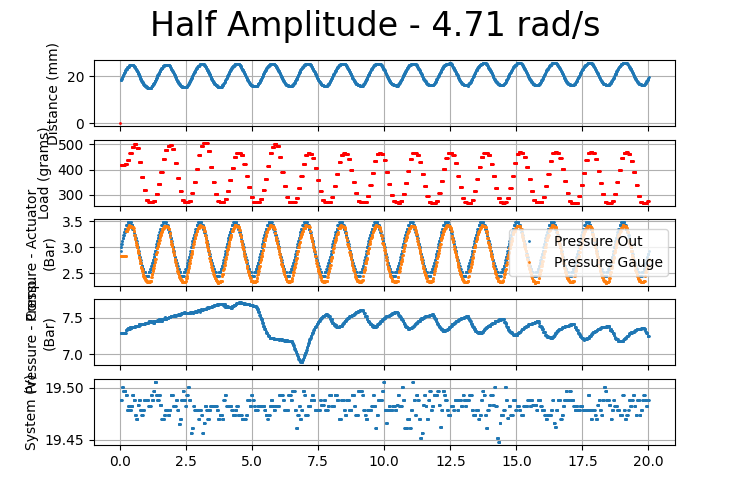

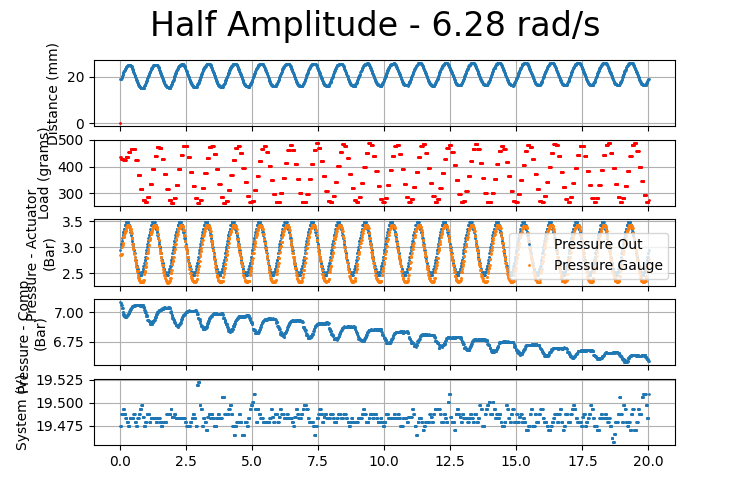

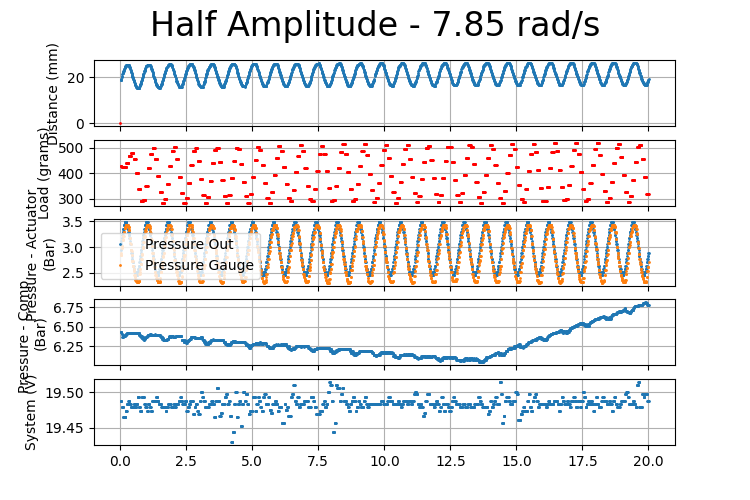

...

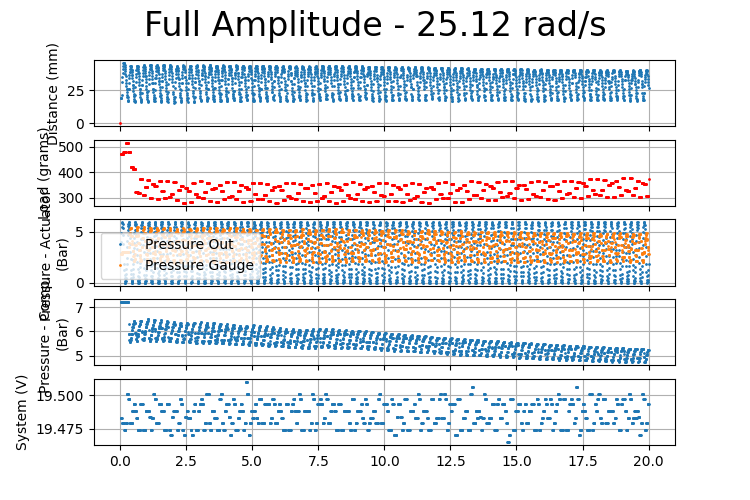

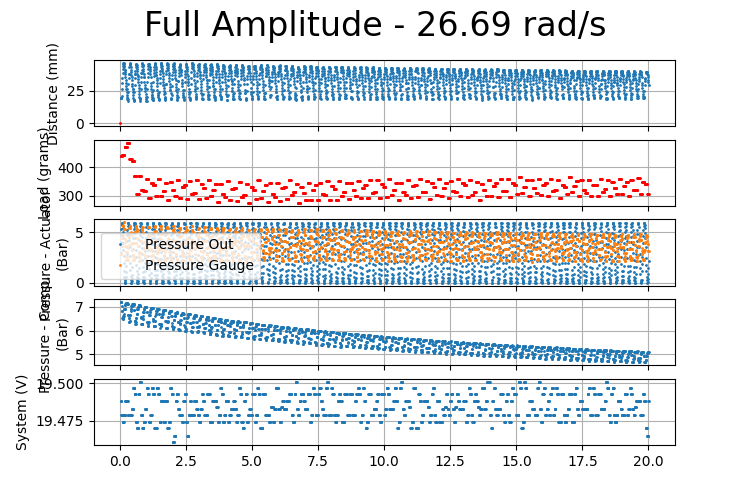

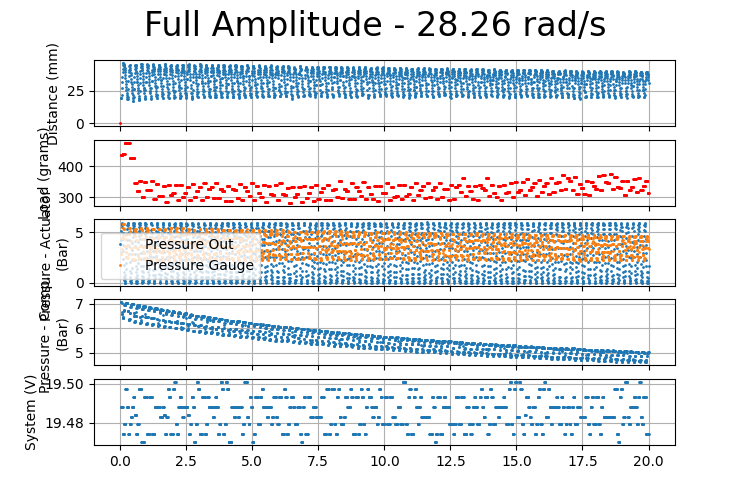

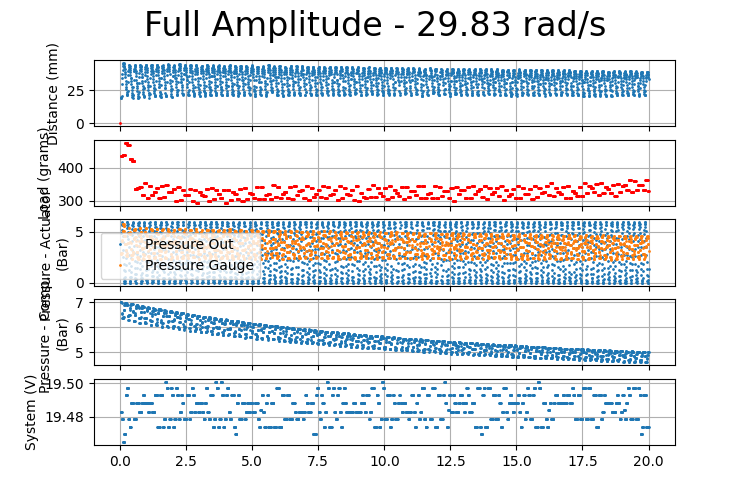

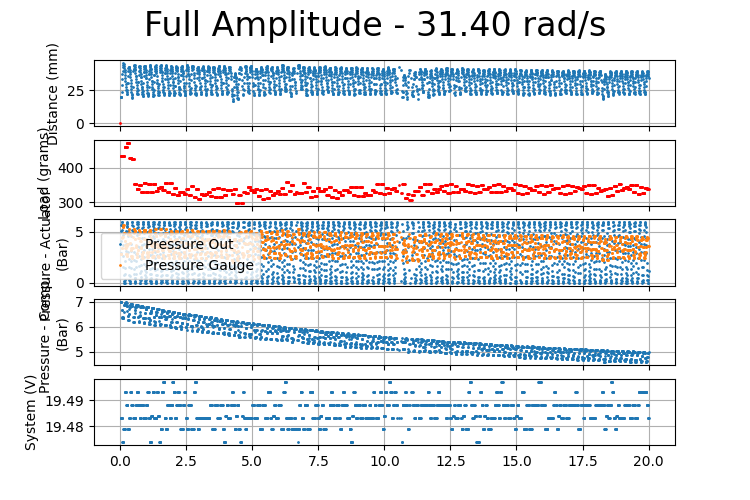

In [77]:
n_points = len(data_half.keys())
n_points_per_row = n_points//4
accessors = list(data_half.keys())
ordered_accessors = [float(elem) for elem in data_half.keys()]
accessors = [x for _, x in sorted(zip(ordered_accessors, accessors))]

for key in accessors:
    name = "Half Amplitude - " + key + " rad/s"
    dat = data_half[key]
    plot_test(dat, name)
    
for key in accessors:
    name = "Full Amplitude - " + key + " rad/s"
    dat = data_full[key]
    plot_test(dat, name)

In [ ]:
import numpy, scipy
from scipy.signal import correlate
from numpy import pi, random
from scipy.signal import savgol_filter
from scipy.fft import fft, fftfreq



n_points = len(data_full.keys())
n_points_per_row = n_points//4
accessors = list(data_full.keys())
ordered_accessors = [float(elem) for elem in data_full.keys()]
accessors = [x for _, x in sorted(zip(ordered_accessors, accessors))]

frqs = []
mags = []
for key in accessors:
    #fig, axis = plt.subplots()
    frq = key
    dat = data_full[key].copy()
    name = frq+" rad/s"
    bl_idx = ((dat["p_o"] > 0))
    dat = dat[bl_idx]
    dat["p_o"] = savgol_filter(dat["p_o"], 15, 3)
    bl_idx = ((dat["strain"] > 0.7))
    dat = dat[bl_idx]
    dat["strain"] = savgol_filter(dat["strain"], 15, 3)
    xcorr = correlate(dat["p_o"], dat["p_p"])
    t = np.array(dat["t"])
    nsamples = len(t)
    dt = numpy.linspace(-t[-1], t[-1], 2*nsamples-1)
    recovered_time_shift = dt[xcorr.argmax()]
    period = float(frq)*2*pi
    recovered_phase_shift = 2*pi*(((0.5 + recovered_time_shift/period) % 1.0) - 0.5)
    #print(f"Recovered phase shift:{recovered_phase_shift/pi:.5f} pi, frq = {frq}")
    M = dat['p_p'].max()/dat['p_o'].max()
    frqs.append(float(frq))
    mags.append(M)
    print(f"Frq: {frq}, M: {M}")
    # Number of sample points
    # sample spacing
    #yf = fft(dat["p_p"].to_numpy())
    #N = len(t)
    #xf = fftfreq(N, dat["t"])[:N//2]
    #plt.plot(xf, 2.0/N * np.abs(yf[0:N//2]))
    #plt.grid()
    #plt.show()

fig, axes = plt.subplots()
plt.plot(frqs, mags)
plt.show()

107.86428171869028
2157


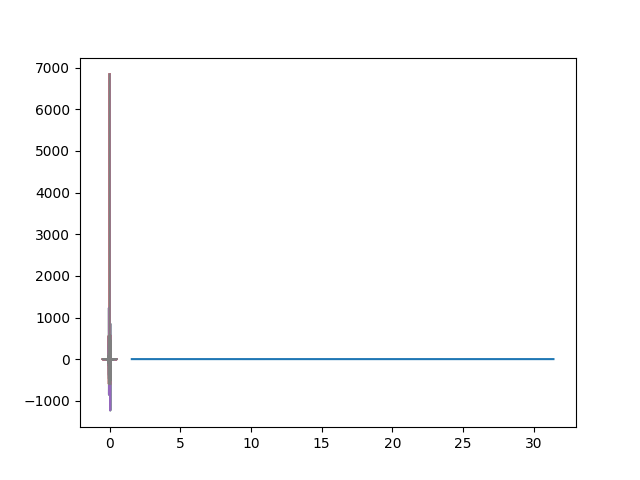

In [75]:

t = dat["t"].to_numpy()
sample_rate = 1/np.diff(t).mean()
print(sample_rate)
print(t.shape[-1])
sp = np.fft.fft(dat["p_o"])
frq = np.fft.fftfreq(t.shape[-1])
plt.plot(frq, sp.real)
plt.show()

In [32]:
dat["p_o"].to_numpy()

array([2.96703922, 2.97439216, 2.98271795, ..., 2.94779186, 2.94317647,
       2.93258824])